In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import warnings

from plotly.offline import iplot, init_notebook_mode

init_notebook_mode()

plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
#plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Technical Analysis in Python

## Creating a Candlestick Chart

### Getting ready

1. Import the libraries:

In [3]:
import pandas as pd 
import yfinance as yf

2. Download the adjusted prices from Yahoo Finance:

In [4]:
df_twtr = yf.download('TWTR', 
                       start='2018-01-01', 
                       end='2018-12-31',
                       progress=False,
                       auto_adjust=True)

### How to do it...

1. Import the libraries:

In [5]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

cf.set_config_file(theme='ggplot',sharing='public',offline=True)

# cf.go_offline()
init_notebook_mode()

As an alternative to running `cf.go_offline()` every time, we can also modify the settings to always use the offline mode by running: `cf.set_config_file(offline=True)`. We can then view the settings using `cf.get_config_file()`.

2. Create the candlestick chart using Twitter's stock prices:

In [6]:
df_twtr.head()

,Open,High,Low,Close,Volume
Date,,,,,
2018-01-02,24.070000,24.570000,23.850000,24.510000,15297200
2018-01-03,24.559999,24.680000,24.070000,24.450001,12832600
2018-01-04,24.500000,24.590000,23.690001,23.990000,17653500
2018-01-05,24.070000,24.570000,23.879999,24.320000,14953200
2018-01-08,24.370001,24.780001,23.879999,24.590000,17831300


In [7]:
qf = cf.QuantFig(df_twtr, title="Twitter's Stock Price", legend='top', name='TWTR')

In [8]:
qf.iplot()

3. Add volume and moving averages to the figure:

In [9]:
qf.add_volume()
qf.add_sma(periods=20, column='Close', color='red')
qf.add_ema(periods=20, color='green') 

4. Display the plot:

In [10]:
qf.iplot()

In [11]:
df_twtr.drop(columns=["Volume"]).iplot(kind="spread")

# see a variety of different plots e can make from a dataframe using df.iplot(kind = ...) at the following
# https://github.com/santosjorge/cufflinks/blob/master/Cufflinks%20Tutorial%20-%20Plotly.ipynb

type qf.add and press tab to see other options that we can add to the quant figure

In [12]:
qf = cf.QuantFig(df_twtr, title="Twitter's Stock Price", legend='top', name='TWTR')
qf.add_sma([10,20],width=2,color=['green','lightgreen'],legendgroup=True)
qf.add_rsi(periods=20,color='java')
qf.add_bollinger_bands(periods=20,boll_std=2,colors=['magenta','grey'],fill=True)
qf.add_volume()
qf.add_macd()
qf.iplot()

## Backtesting a Strategy Based on Simple Moving Average

Here is some extra material on backtrader, following https://www.backtrader.com/docu/quickstart/quickstart/

In [13]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

import backtrader as bt

if __name__ == '__main__':
    cerebro = bt.Cerebro()

    print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

    cerebro.run()

    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 10000.00
Final Portfolio Value: 10000.00


In [14]:
cerebro = bt.Cerebro()
cerebro.broker.setcash(100000.0)

print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

cerebro.run()

print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 100000.00
Final Portfolio Value: 100000.00


In [51]:
from datetime import datetime  # For datetime objects
import os.path  # To manage paths
import sys  # To find out the script name (in argv[0])

In [52]:
cerebro = bt.Cerebro()

data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))
# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(100000.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 100000.00
Final Portfolio Value: 100000.00


In [53]:
# Create a Stratey
class TestStrategy(bt.Strategy):

    def log(self, txt, dt=None):
        ''' Logging function for this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        # Keep a reference to the "close" line in the data[0] dataseries
        self.dataclose = self.datas[0].close

    def next(self):
        # Simply log the closing price of the series from the reference
        self.log('Close, %.2f' % self.dataclose[0])


# Create a cerebro entity
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(TestStrategy)

data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(100000.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 100000.00
2018-01-02, Close, 41.11
2018-01-03, Close, 41.10
2018-01-04, Close, 41.29
2018-01-05, Close, 41.76
2018-01-08, Close, 41.60
2018-01-09, Close, 41.60
2018-01-10, Close, 41.59
2018-01-11, Close, 41.83
2018-01-12, Close, 42.26
2018-01-16, Close, 42.04
2018-01-17, Close, 42.74
2018-01-18, Close, 42.78
2018-01-19, Close, 42.59
2018-01-22, Close, 42.24
2018-01-23, Close, 42.25
2018-01-24, Close, 41.57
2018-01-25, Close, 40.83
2018-01-26, Close, 40.93
2018-01-29, Close, 40.08
2018-01-30, Close, 39.84
2018-01-31, Close, 39.95
2018-02-01, Close, 40.04
2018-02-02, Close, 38.30
2018-02-05, Close, 37.34
2018-02-06, Close, 38.90
2018-02-07, Close, 38.07
2018-02-08, Close, 37.02
2018-02-09, Close, 37.48
2018-02-12, Close, 38.98
2018-02-13, Close, 39.38
2018-02-14, Close, 40.10
2018-02-15, Close, 41.45
2018-02-16, Close, 41.31
2018-02-20, Close, 41.17
2018-02-21, Close, 40.99
2018-02-22, Close, 41.33
2018-02-23, Close, 42.05
2018-02-26, Close, 42.88
2018-02-27, Cl

In [54]:
class TestStrategy(bt.Strategy):

    def log(self, txt, dt=None):
        ''' Logging function fot this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        # Keep a reference to the "close" line in the data[0] dataseries
        self.dataclose = self.datas[0].close

    def next(self):
        # Simply log the closing price of the series from the reference
        self.log('Close, %.2f' % self.dataclose[0])

        if self.dataclose[0] < self.dataclose[-1]:
            # current close less than previous close

            if self.dataclose[-1] < self.dataclose[-2]:
                # previous close less than the previous close

                # BUY, BUY, BUY!!! (with all possible default parameters)
                self.log('BUY CREATE, %.2f' % self.dataclose[0])
                self.buy()

In [55]:
# Create a cerebro entity
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(TestStrategy)

data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(100000.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 100000.00
2018-01-02, Close, 41.11
2018-01-03, Close, 41.10
2018-01-04, Close, 41.29
2018-01-05, Close, 41.76
2018-01-08, Close, 41.60
2018-01-09, Close, 41.60
2018-01-10, Close, 41.59
2018-01-11, Close, 41.83
2018-01-12, Close, 42.26
2018-01-16, Close, 42.04
2018-01-17, Close, 42.74
2018-01-18, Close, 42.78
2018-01-19, Close, 42.59
2018-01-22, Close, 42.24
2018-01-22, BUY CREATE, 42.24
2018-01-23, Close, 42.25
2018-01-24, Close, 41.57
2018-01-25, Close, 40.83
2018-01-25, BUY CREATE, 40.83
2018-01-26, Close, 40.93
2018-01-29, Close, 40.08
2018-01-30, Close, 39.84
2018-01-30, BUY CREATE, 39.84
2018-01-31, Close, 39.95
2018-02-01, Close, 40.04
2018-02-02, Close, 38.30
2018-02-05, Close, 37.34
2018-02-05, BUY CREATE, 37.34
2018-02-06, Close, 38.90
2018-02-07, Close, 38.07
2018-02-08, Close, 37.02
2018-02-08, BUY CREATE, 37.02
2018-02-09, Close, 37.48
2018-02-12, Close, 38.98
2018-02-13, Close, 39.38
2018-02-14, Close, 40.10
2018-02-15, Close, 41.45
2018-02-16, Cl

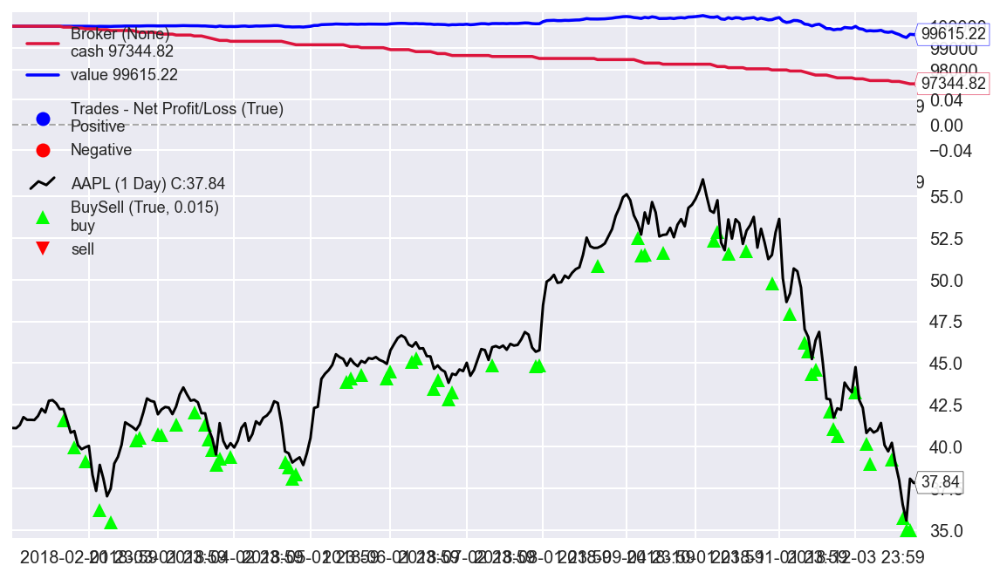

[[<Figure size 576x324 with 3 Axes>]]

In [56]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [8, 4.5]
cerebro.plot(iplot=False)

In [57]:
# Another strategy

# Create a Stratey
class TestStrategy(bt.Strategy):

    def log(self, txt, dt=None):
        ''' Logging function fot this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        # Keep a reference to the "close" line in the data[0] dataseries
        self.dataclose = self.datas[0].close

        # To keep track of pending orders
        self.order = None

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        # Attention: broker could reject order if not enough cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log('BUY EXECUTED, %.2f' % order.executed.price)
            elif order.issell():
                self.log('SELL EXECUTED, %.2f' % order.executed.price)

            self.bar_executed = len(self)

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        # Write down: no pending order
        self.order = None
        
    
    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log('OPERATION PROFIT, GROSS %.2f, NET %.2f' %
                 (trade.pnl, trade.pnlcomm))

    def next(self):
        # Simply log the closing price of the series from the reference
        self.log('Close, %.2f' % self.dataclose[0])

        # Check if an order is pending ... if yes, we cannot send a 2nd one
        if self.order:
            return

        # Check if we are in the market
        if not self.position:

            # Not yet ... we MIGHT BUY if ...
            if self.dataclose[0] < self.dataclose[-1]:
                    # current close less than previous close

                    if self.dataclose[-1] < self.dataclose[-2]:
                        # previous close less than the previous close

                        # BUY, BUY, BUY!!! (with default parameters)
                        self.log('BUY CREATE, %.2f' % self.dataclose[0])

                        # Keep track of the created order to avoid a 2nd order
                        self.order = self.buy()

        else:

            # Already in the market ... we might sell
            if len(self) >= (self.bar_executed + 5):
                # SELL, SELL, SELL!!! (with all possible default parameters)
                self.log('SELL CREATE, %.2f' % self.dataclose[0])

                # Keep track of the created order to avoid a 2nd order
                self.order = self.sell()

Starting Portfolio Value: 100000.00
2018-01-02, Close, 41.11
2018-01-03, Close, 41.10
2018-01-04, Close, 41.29
2018-01-05, Close, 41.76
2018-01-08, Close, 41.60
2018-01-09, Close, 41.60
2018-01-10, Close, 41.59
2018-01-11, Close, 41.83
2018-01-12, Close, 42.26
2018-01-16, Close, 42.04
2018-01-17, Close, 42.74
2018-01-18, Close, 42.78
2018-01-19, Close, 42.59
2018-01-22, Close, 42.24
2018-01-22, BUY CREATE, 42.24
2018-01-23, BUY EXECUTED, 42.31
2018-01-23, Close, 42.25
2018-01-24, Close, 41.57
2018-01-25, Close, 40.83
2018-01-26, Close, 40.93
2018-01-29, Close, 40.08
2018-01-30, Close, 39.84
2018-01-30, SELL CREATE, 39.84
2018-01-31, SELL EXECUTED, 39.82
2018-01-31, OPERATION PROFIT, GROSS -2.49, NET -2.49
2018-01-31, Close, 39.95
2018-02-01, Close, 40.04
2018-02-02, Close, 38.30
2018-02-05, Close, 37.34
2018-02-05, BUY CREATE, 37.34
2018-02-06, BUY EXECUTED, 36.95
2018-02-06, Close, 38.90
2018-02-07, Close, 38.07
2018-02-08, Close, 37.02
2018-02-09, Close, 37.48
2018-02-12, Close, 38.9

<IPython.core.display.Javascript object>


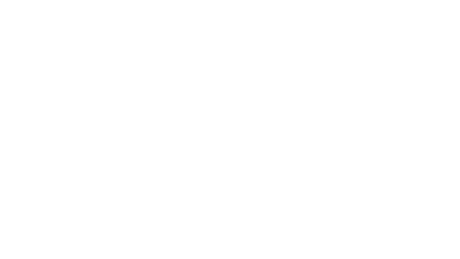

[[<Figure size 576x324 with 3 Axes>]]

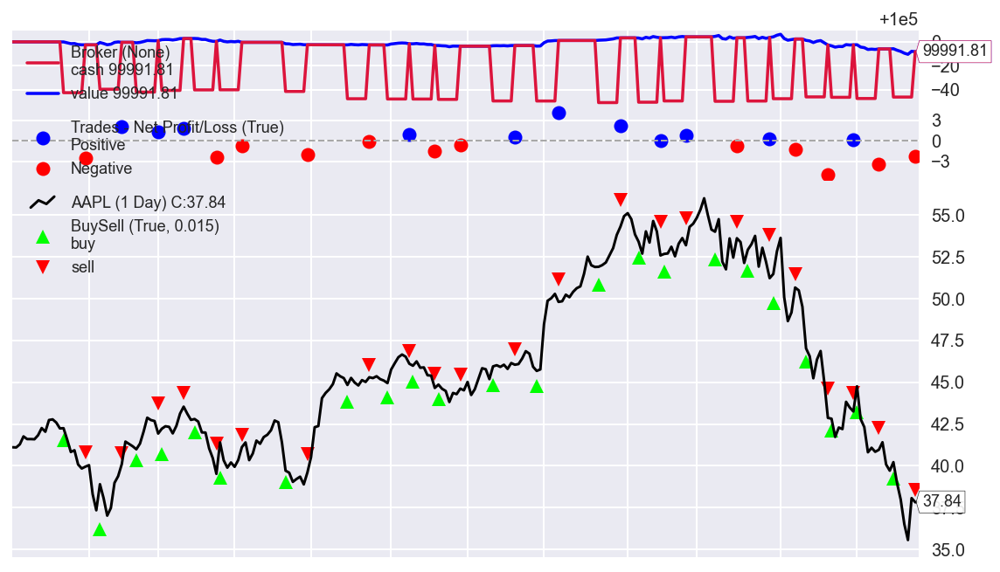

In [58]:
# Create a cerebro entity
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(TestStrategy)

data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(100000.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

cerebro.plot()

### Adding commision

Starting Portfolio Value: 100000.00
2018-01-02, Close, 41.11
2018-01-03, Close, 41.10
2018-01-04, Close, 41.29
2018-01-05, Close, 41.76
2018-01-08, Close, 41.60
2018-01-09, Close, 41.60
2018-01-10, Close, 41.59
2018-01-11, Close, 41.83
2018-01-12, Close, 42.26
2018-01-16, Close, 42.04
2018-01-17, Close, 42.74
2018-01-18, Close, 42.78
2018-01-19, Close, 42.59
2018-01-22, Close, 42.24
2018-01-22, BUY CREATE, 42.24
2018-01-23, BUY EXECUTED, 42.31
2018-01-23, Close, 42.25
2018-01-24, Close, 41.57
2018-01-25, Close, 40.83
2018-01-26, Close, 40.93
2018-01-29, Close, 40.08
2018-01-30, Close, 39.84
2018-01-30, SELL CREATE, 39.84
2018-01-31, SELL EXECUTED, 39.82
2018-01-31, OPERATION PROFIT, GROSS -2.49, NET -2.57
2018-01-31, Close, 39.95
2018-02-01, Close, 40.04
2018-02-02, Close, 38.30
2018-02-05, Close, 37.34
2018-02-05, BUY CREATE, 37.34
2018-02-06, BUY EXECUTED, 36.95
2018-02-06, Close, 38.90
2018-02-07, Close, 38.07
2018-02-08, Close, 37.02
2018-02-09, Close, 37.48
2018-02-12, Close, 38.9

<IPython.core.display.Javascript object>


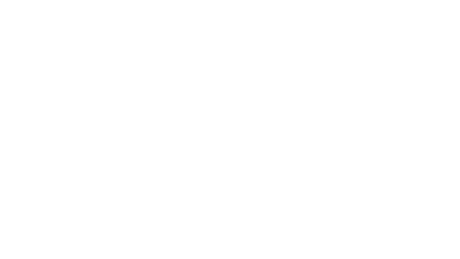

[[<Figure size 576x324 with 3 Axes>]]

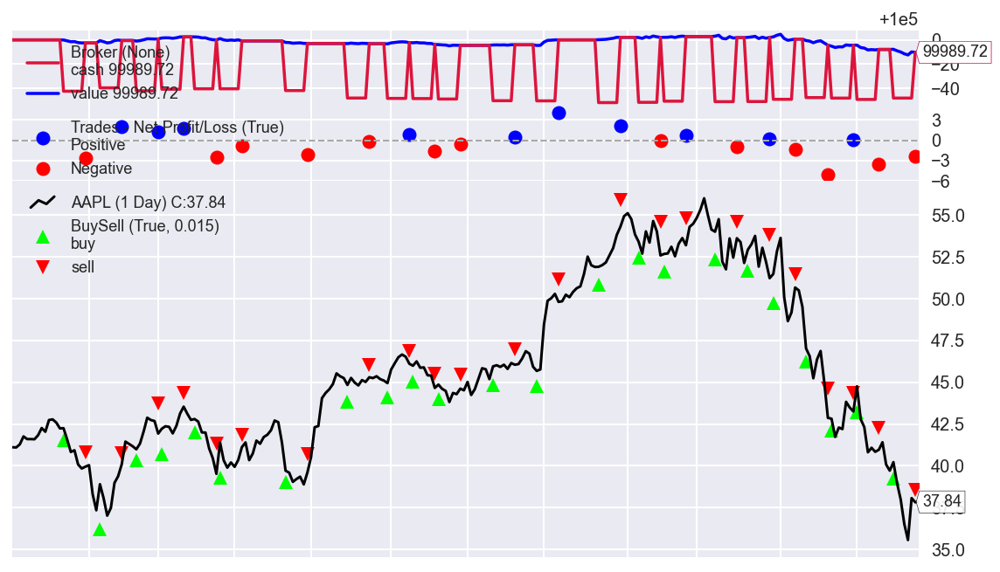

In [59]:
# Create a cerebro entity
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(TestStrategy)

data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))
# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(100000.0)

# Set the commission - 0.1% ... divide by 100 to remove the %
cerebro.broker.setcommission(commission=0.001)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
cerebro.plot()

### Customizing the Strategy: Parameters

In [60]:
params = (('myparam', 27), ('exitbars', 5))

In [61]:
# Create a Stratey
class TestStrategy(bt.Strategy):
    params = (
        ('exitbars', 5),
    )

    def log(self, txt, dt=None):
        ''' Logging function fot this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        # Keep a reference to the "close" line in the data[0] dataseries
        self.dataclose = self.datas[0].close

        # To keep track of pending orders and buy price/commission
        self.order = None
        self.buyprice = None
        self.buycomm = None

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        # Attention: broker could reject order if not enough cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    'BUY EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                    (order.executed.price,
                     order.executed.value,
                     order.executed.comm))

                self.buyprice = order.executed.price
                self.buycomm = order.executed.comm
            else:  # Sell
                self.log('SELL EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                         (order.executed.price,
                          order.executed.value,
                          order.executed.comm))

            self.bar_executed = len(self)

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log('OPERATION PROFIT, GROSS %.2f, NET %.2f' %
                 (trade.pnl, trade.pnlcomm))

    def next(self):
        # Simply log the closing price of the series from the reference
        self.log('Close, %.2f' % self.dataclose[0])

        # Check if an order is pending ... if yes, we cannot send a 2nd one
        if self.order:
            return

        # Check if we are in the market
        if not self.position:

            # Not yet ... we MIGHT BUY if ...
            if self.dataclose[0] < self.dataclose[-1]:
                    # current close less than previous close

                    if self.dataclose[-1] < self.dataclose[-2]:
                        # previous close less than the previous close

                        # BUY, BUY, BUY!!! (with default parameters)
                        self.log('BUY CREATE, %.2f' % self.dataclose[0])

                        # Keep track of the created order to avoid a 2nd order
                        self.order = self.buy()

        else:

            # Already in the market ... we might sell
            if len(self) >= (self.bar_executed + self.params.exitbars):
                # SELL, SELL, SELL!!! (with all possible default parameters)
                self.log('SELL CREATE, %.2f' % self.dataclose[0])

                # Keep track of the created order to avoid a 2nd order
                self.order = self.sell()

Starting Portfolio Value: 100000.00
2018-01-02, Close, 41.11
2018-01-02, BUY CREATE, 41.11
2018-01-03, BUY EXECUTED, Price: 41.17, Cost: 411.70, Comm 0.41
2018-01-03, Close, 41.10
2018-01-04, Close, 41.29
2018-01-05, Close, 41.76
2018-01-08, Close, 41.60
2018-01-09, Close, 41.60
2018-01-10, Close, 41.59
2018-01-10, SELL CREATE, 41.59
2018-01-11, SELL EXECUTED, Price: 41.66, Cost: 411.70, Comm 0.42
2018-01-11, OPERATION PROFIT, GROSS 4.90, NET 4.07
2018-01-11, Close, 41.83
2018-01-12, Close, 42.26
2018-01-16, Close, 42.04
2018-01-17, Close, 42.74
2018-01-18, Close, 42.78
2018-01-19, Close, 42.59
2018-01-22, Close, 42.24
2018-01-22, BUY CREATE, 42.24
2018-01-23, BUY EXECUTED, Price: 42.31, Cost: 423.10, Comm 0.42
2018-01-23, Close, 42.25
2018-01-24, Close, 41.57
2018-01-25, Close, 40.83
2018-01-26, Close, 40.93
2018-01-29, Close, 40.08
2018-01-30, Close, 39.84
2018-01-30, SELL CREATE, 39.84
2018-01-31, SELL EXECUTED, Price: 39.82, Cost: 423.10, Comm 0.40
2018-01-31, OPERATION PROFIT, GRO

<IPython.core.display.Javascript object>


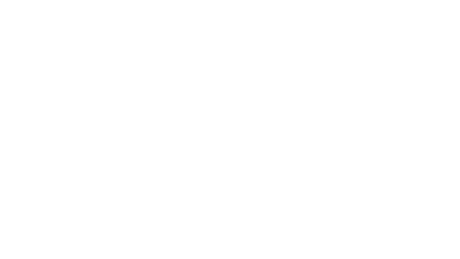

[[<Figure size 576x324 with 3 Axes>]]

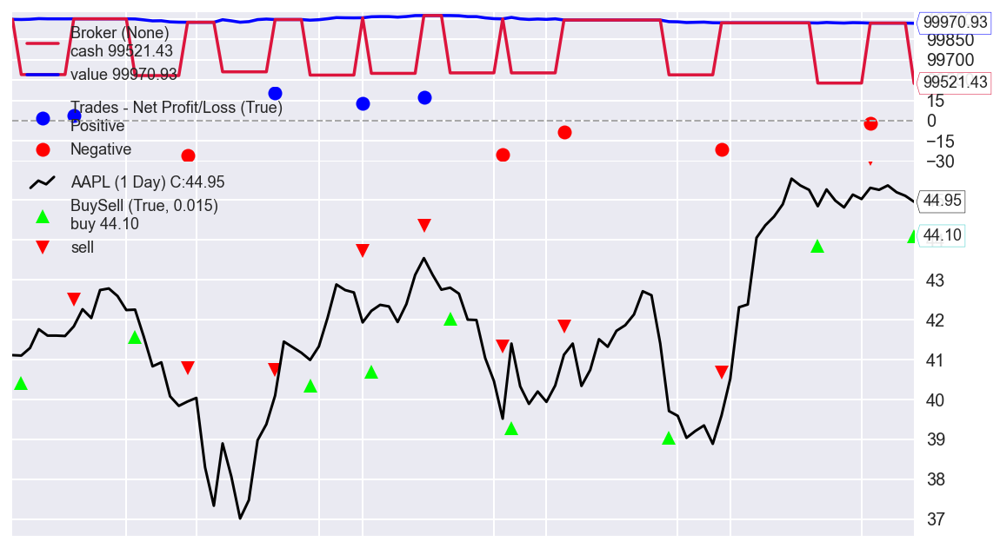

In [62]:
# Create a cerebro entity
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(TestStrategy)

data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 6, 1))
# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(100000.0)

# Add a FixedSize sizer according to the stake
cerebro.addsizer(bt.sizers.FixedSize, stake=10)

# Set the commission - 0.1% ... divide by 100 to remove the %
cerebro.broker.setcommission(commission=0.001)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
cerebro.plot()

### How to do it...

#### Signal 

1. Import the libraries:

In [63]:
from datetime import datetime
import backtrader as bt

2. Define a class representing the trading strategy:

In [64]:
class SmaSignal(bt.Signal):
    params = (('period', 20), )
    
    def __init__(self):
        self.lines.signal = self.data - bt.ind.SMA(period=self.p.period)

3. Download data from Yahoo Finance:

In [65]:
data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

4. Set up the backtest:

In [66]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.add_signal(bt.SIGNAL_LONG, SmaSignal)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

5. Run the backtest:

In [67]:
print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 1000.00
Final Portfolio Value: 1002.84


6. Plot the results:

<IPython.core.display.Javascript object>


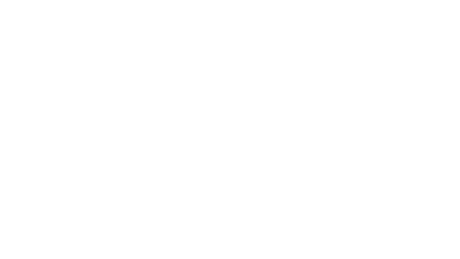

[[<Figure size 576x324 with 3 Axes>]]

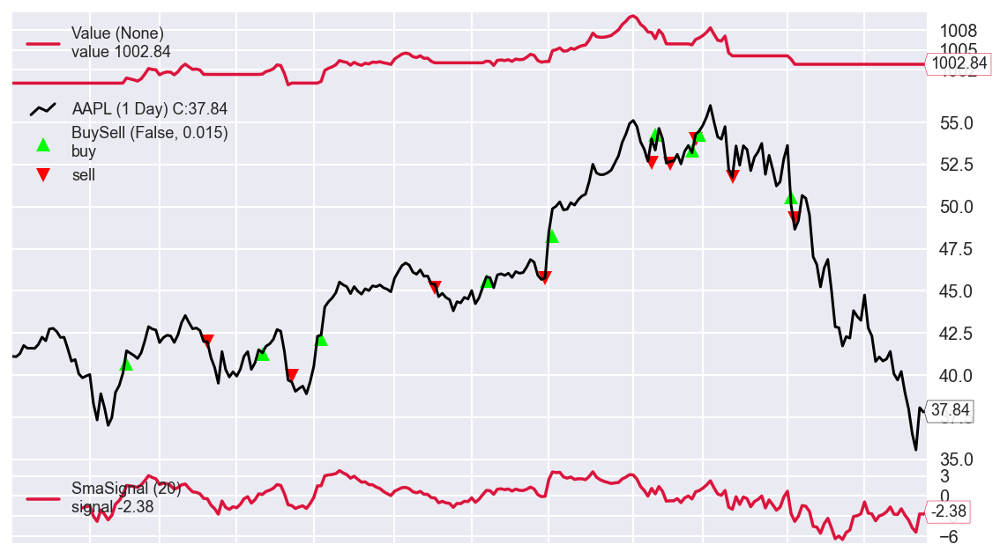

In [69]:
cerebro.plot(iplot=True, volume=False)

#### Strategy

1. The template of the strategy looks like:

In [70]:
class SmaStrategy(bt.Strategy):
    params = (('ma_period', 20), )

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close

        # keep track of pending orders/buy price/buy commission
        self.order = None
        self.price = None
        self.comm = None

        # add a simple moving average indicator
        self.sma = bt.ind.SMA(self.datas[0],
                              period=self.params.ma_period)
        
    def log(self, txt):
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # order already submitted/accepted - no action required
            return

        # report executed order
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(f'BUY EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}')
                self.price = order.executed.price
                self.comm = order.executed.comm
            else:
                self.log(f'SELL EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}')

        # report failed order
        elif order.status in [order.Canceled, order.Margin, 
                              order.Rejected]:
            self.log('Order Failed')

        # set no pending order
        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'OPERATION RESULT --- Gross: {trade.pnl:.2f}, Net: {trade.pnlcomm:.2f}')

    def next(self):
        # do nothing if an order is pending
        if self.order:
            return

        # check if there is already a position
        if not self.position:
            # buy condition
            if self.data_close[0] > self.sma[0]:
                self.log(f'BUY CREATED --- Price: {self.data_close[0]:.2f}')
                self.order = self.buy()
        else:
            # sell condition
            if self.data_close[0] < self.sma[0]:            
                self.log(f'SELL CREATED --- Price: {self.data_close[0]:.2f}')
                self.order = self.sell()

2. Set up the backtest:

In [71]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.addstrategy(SmaStrategy)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

3. Run the backtest:

In [72]:
print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 1000.00
2018-02-14, BUY CREATED --- Price: 40.10
2018-02-15, BUY EXECUTED --- Price: 40.68, Cost: 40.68, Commission: 0.00
2018-03-19, SELL CREATED --- Price: 42.00
2018-03-20, SELL EXECUTED --- Price: 41.99, Cost: 40.68, Commission: 0.00
2018-03-20, OPERATION RESULT --- Gross: 1.31, Net: 1.31
2018-04-10, BUY CREATED --- Price: 41.51
2018-04-11, BUY EXECUTED --- Price: 41.27, Cost: 41.27, Commission: 0.00
2018-04-20, SELL CREATED --- Price: 39.71
2018-04-23, SELL EXECUTED --- Price: 39.97, Cost: 41.27, Commission: 0.00
2018-04-23, OPERATION RESULT --- Gross: -1.30, Net: -1.30
2018-05-02, BUY CREATED --- Price: 42.31
2018-05-03, BUY EXECUTED --- Price: 42.14, Cost: 42.14, Commission: 0.00
2018-06-15, SELL CREATED --- Price: 45.42
2018-06-18, SELL EXECUTED --- Price: 45.19, Cost: 42.14, Commission: 0.00
2018-06-18, OPERATION RESULT --- Gross: 3.05, Net: 3.05
2018-07-06, BUY CREATED --- Price: 45.21
2018-07-09, BUY EXECUTED --- Price: 45.58, Cost: 45.58, Commissio

### There's more

We used the Jupyter magic command `%load` to import the content of the backtrader_sma_strategy_optimization.py file.

In [73]:
#%load backtrader_sma_strategy_optimization.py

# Create a Stratey
class SmaStrategy(bt.Strategy):
    params = (('ma_period', 20),)

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close

        # keep track of pending orders
        self.order = None

        # add a simple moving average indicator
        self.sma = bt.ind.SMA(self.datas[0], period=self.params.ma_period)

    def log(self, txt):
        '''Logging function'''
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        # set no pending order
        self.order = None

    def next(self):
        # do nothing if an order is pending
        if self.order:
            return

        # check if there is already a position
        if not self.position:
            # buy condition
            if self.data_close[0] > self.sma[0]:
                self.order = self.buy()
        else:
            # sell condition
            if self.data_close[0] < self.sma[0]:
                self.order = self.sell()

    def stop(self):
        self.log(f'(ma_period = {self.params.ma_period:2d}) --- Terminal Value: {self.broker.getvalue():.2f}')

# download data
data = bt.feeds.YahooFinanceData(dataname='AAPL',
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

# create a Cerebro entity
cerebro = bt.Cerebro(stdstats = False)

# set up the backtest
cerebro.adddata(data)
cerebro.optstrategy(SmaStrategy, ma_period=range(10, 31))
cerebro.broker.setcash(1000.0)
cerebro.run(maxcpus=1)

2018-12-28, (ma_period = 10) --- Terminal Value: 1001.54
2018-12-28, (ma_period = 11) --- Terminal Value: 1001.07
2018-12-28, (ma_period = 12) --- Terminal Value: 1001.42
2018-12-28, (ma_period = 13) --- Terminal Value: 998.12
2018-12-28, (ma_period = 14) --- Terminal Value: 994.40
2018-12-28, (ma_period = 15) --- Terminal Value: 995.45
2018-12-28, (ma_period = 16) --- Terminal Value: 995.06
2018-12-28, (ma_period = 17) --- Terminal Value: 998.24
2018-12-28, (ma_period = 18) --- Terminal Value: 998.74
2018-12-28, (ma_period = 19) --- Terminal Value: 1001.29
2018-12-28, (ma_period = 20) --- Terminal Value: 1002.84
2018-12-28, (ma_period = 21) --- Terminal Value: 1003.33
2018-12-28, (ma_period = 22) --- Terminal Value: 1005.18
2018-12-28, (ma_period = 23) --- Terminal Value: 1004.56
2018-12-28, (ma_period = 24) --- Terminal Value: 1004.56
2018-12-28, (ma_period = 25) --- Terminal Value: 1004.44
2018-12-28, (ma_period = 26) --- Terminal Value: 1002.27
2018-12-28, (ma_period = 27) --- Term

[[<backtrader.cerebro.OptReturn at 0x1b420fbfe48>],

### Is this dubious practice? Could lead to overfitting

## Calculating Bollinger Bands and testing a buy/sell strategy

1. Import the libraries:

In [74]:
import backtrader as bt
import datetime
import pandas as pd
import matplotlib.pyplot as plt

2. The template of the strategy looks like:

In [75]:
class BBand_Strategy(bt.Strategy):
    params = (('period', 20),
              ('devfactor', 2.0),)

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close
        self.data_open = self.datas[0].open

        # keep track of pending orders/buy price/buy commission
        self.order = None
        self.price = None
        self.comm = None

        # add Bollinger Bands indicator and track the buy/sell signals
        self.b_band = bt.ind.BollingerBands(self.datas[0], 
                                            period=self.p.period, 
                                            devfactor=self.p.devfactor)
        self.buy_signal = bt.ind.CrossOver(self.datas[0], 
                                           self.b_band.lines.bot)
        self.sell_signal = bt.ind.CrossOver(self.datas[0], 
                                            self.b_band.lines.top)

    def log(self, txt):
        '''Logging function'''
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # order already submitted/accepted - no action required
            return

        # report executed order
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    f'BUY EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}'
                )
                self.price = order.executed.price
                self.comm = order.executed.comm
            else:
                self.log(
                    f'SELL EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}'
                )

        # report failed order
        elif order.status in [order.Canceled, order.Margin, 
                              order.Rejected]:
            self.log('Order Failed')

        # set no pending order
        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'OPERATION RESULT --- Gross: {trade.pnl:.2f}, Net: {trade.pnlcomm:.2f}')

    def next_open(self):
        if not self.position:
            if self.buy_signal > 0:
                # calculate the max number of shares ('all-in')
                size = int(self.broker.getcash() / self.datas[0].open)
                # buy order
                self.log(f'BUY CREATED --- Size: {size}, Cash: {self.broker.getcash():.2f}, Open: {self.data_open[0]}, Close: {self.data_close[0]}')
                self.buy(size=size)
        else:
            if self.sell_signal < 0:
                # sell order
                self.log(f'SELL CREATED --- Size: {self.position.size}')
                self.sell(size=self.position.size)

3. Download data:

In [76]:
data = bt.feeds.YahooFinanceData(
    dataname='MSFT',
    fromdate=datetime.datetime(2018, 1, 1),
    todate=datetime.datetime(2018, 12, 31)
)

4. Set up the backtest:

In [77]:
cerebro = bt.Cerebro(stdstats = False, cheat_on_open=True)

cerebro.addstrategy(BBand_Strategy)
cerebro.adddata(data)
cerebro.broker.setcash(10000.0)
cerebro.broker.setcommission(commission=0.001)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)
cerebro.addanalyzer(bt.analyzers.Returns, _name='returns')
cerebro.addanalyzer(bt.analyzers.TimeReturn, _name='time_return')

5. Run the backtest:

In [78]:
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
backtest_result = cerebro.run()
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 10000.00
2018-02-12, BUY CREATED --- Size: 117, Cash: 10000.00, Open: 85.28, Close: 85.66
2018-02-12, BUY EXECUTED --- Price: 85.28, Cost: 9977.76, Commission: 9.98
2018-04-19, SELL CREATED --- Size: 117
2018-04-19, SELL EXECUTED --- Price: 93.12, Cost: 9977.76, Commission: 10.90
2018-04-19, OPERATION RESULT --- Gross: 917.28, Net: 896.41
2018-06-29, BUY CREATED --- Size: 113, Cash: 10896.41, Open: 95.93, Close: 95.62
2018-06-29, BUY EXECUTED --- Price: 95.93, Cost: 10840.09, Commission: 10.84
2018-07-17, SELL CREATED --- Size: 113
2018-07-17, SELL EXECUTED --- Price: 101.44, Cost: 10840.09, Commission: 11.46
2018-07-17, OPERATION RESULT --- Gross: 622.63, Net: 600.33
2018-10-15, BUY CREATED --- Size: 108, Cash: 11496.73, Open: 106.02, Close: 104.74
2018-10-15, BUY EXECUTED --- Price: 106.02, Cost: 11450.16, Commission: 11.45
Final Portfolio Value: 10635.32


6. Plot the results:

<IPython.core.display.Javascript object>


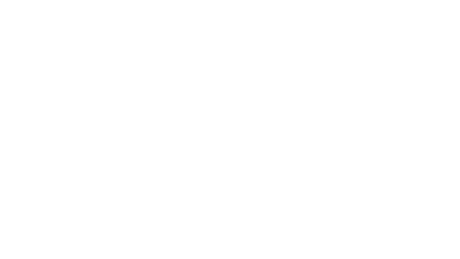

[[<Figure size 576x324 with 4 Axes>]]

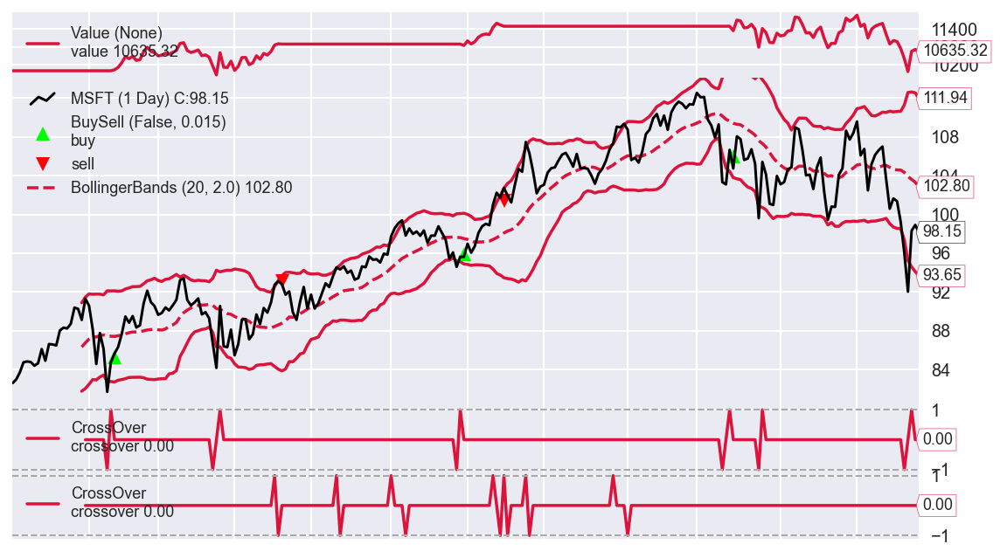

In [79]:
cerebro.plot(iplot=True, volume=False)

7. Run to investigate different returns metrics:

In [80]:
print(backtest_result[0].analyzers.returns.get_analysis())

OrderedDict([('rtot', 0.0615958422644258), ('ravg', 0.0002463833690577032), ('rnorm', 0.0640566255471444), ('rnorm100', 6.40566255471444)])


8. Create a plot of daily portfolio returns:

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

<IPython.core.display.Javascript object>


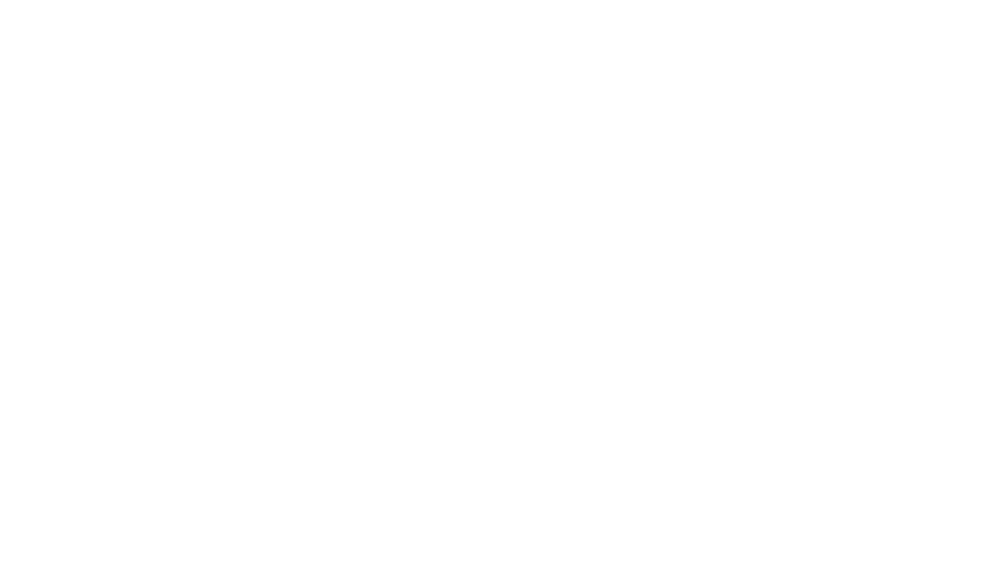

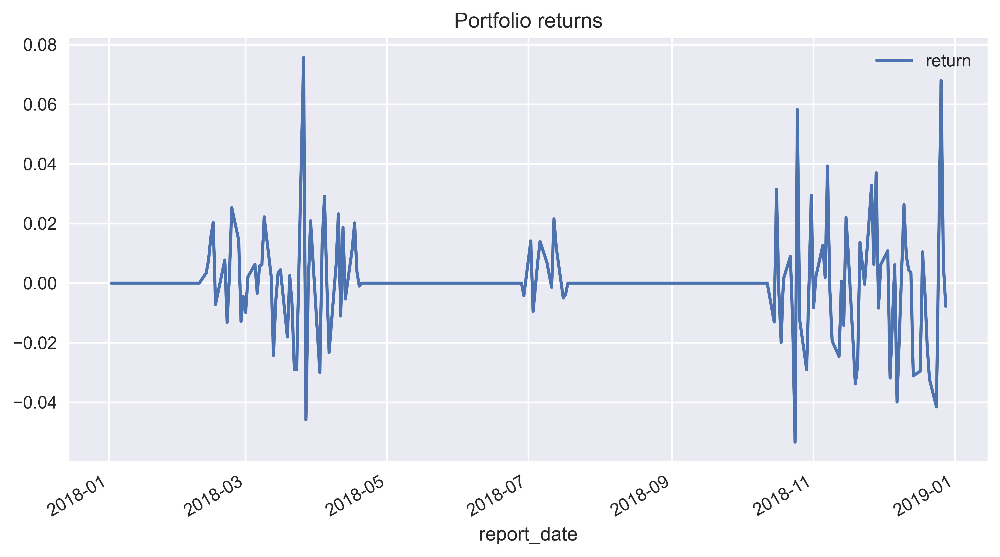

In [83]:
returns_dict = backtest_result[0].analyzers.time_return.get_analysis()
returns_df = pd.DataFrame(list(returns_dict.items()), 
                          columns = ['report_date', 'return']) \
               .set_index('report_date')
returns_df.plot(title='Portfolio returns')

plt.tight_layout()
# plt.savefig('images/ch2_im9.png')
plt.show()

## Calculating the relative strength index and testing a long/short strategy

1. Import the libraries:

In [84]:
from datetime import datetime
import backtrader as bt

2. Define the signal strategy based on bt.SignalStrategy:

In [88]:
# create a Stratey
class RsiSignalStrategy(bt.SignalStrategy):
    params = dict(rsi_periods=14, rsi_upper=70, 
                  rsi_lower=30, rsi_mid=50)

    def __init__(self):
        
        # add RSI indicator
        rsi = bt.indicators.RSI(period=self.p.rsi_periods,
                                upperband=self.p.rsi_upper,
                                lowerband=self.p.rsi_lower)

        # add RSI from TA-lib just for reference (looks like this is deprecated)
        #bt.talib.RSI(self.data, plotname='TA_RSI')
    
        # long condition (with exit)
        rsi_signal_long = bt.ind.CrossUp(rsi, self.p.rsi_lower, plot=False)
        self.signal_add(bt.SIGNAL_LONG, rsi_signal_long)
        self.signal_add(bt.SIGNAL_LONGEXIT, -(rsi > self.p.rsi_mid))

        # short condition (with exit)
        rsi_signal_short = -bt.ind.CrossDown(rsi, self.p.rsi_upper, plot=False)
        self.signal_add(bt.SIGNAL_SHORT, rsi_signal_short)
        self.signal_add(bt.SIGNAL_SHORTEXIT, rsi < self.p.rsi_mid)

3. Download data:

In [90]:
data = bt.feeds.YahooFinanceData(dataname='FB', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

4. Set up and run the backtest:

In [91]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.addstrategy(RsiSignalStrategy)
cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.broker.setcommission(commission=0.001)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

cerebro.run()


5. Plot the results:

<IPython.core.display.Javascript object>


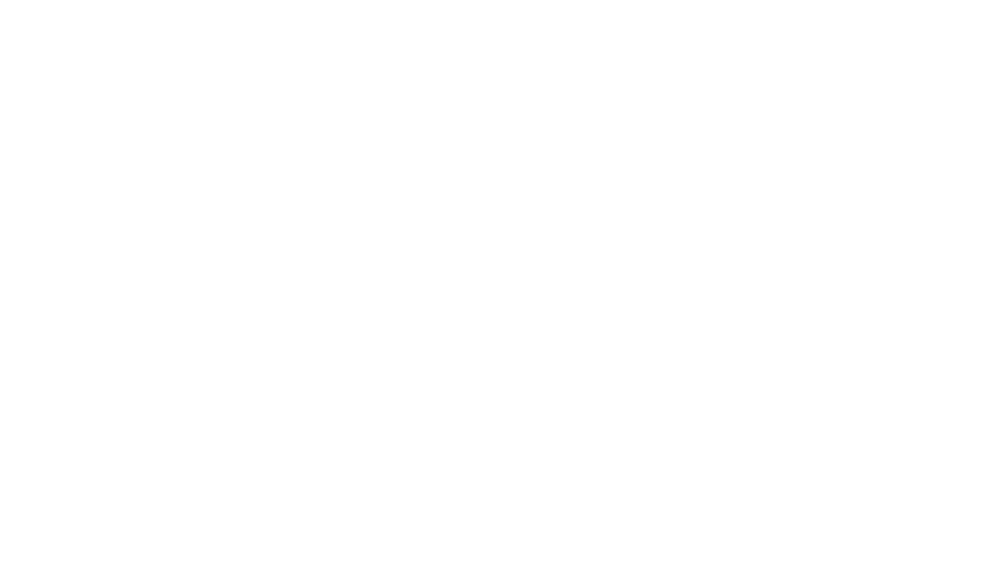

[[<Figure size 2400x1350 with 3 Axes>]]

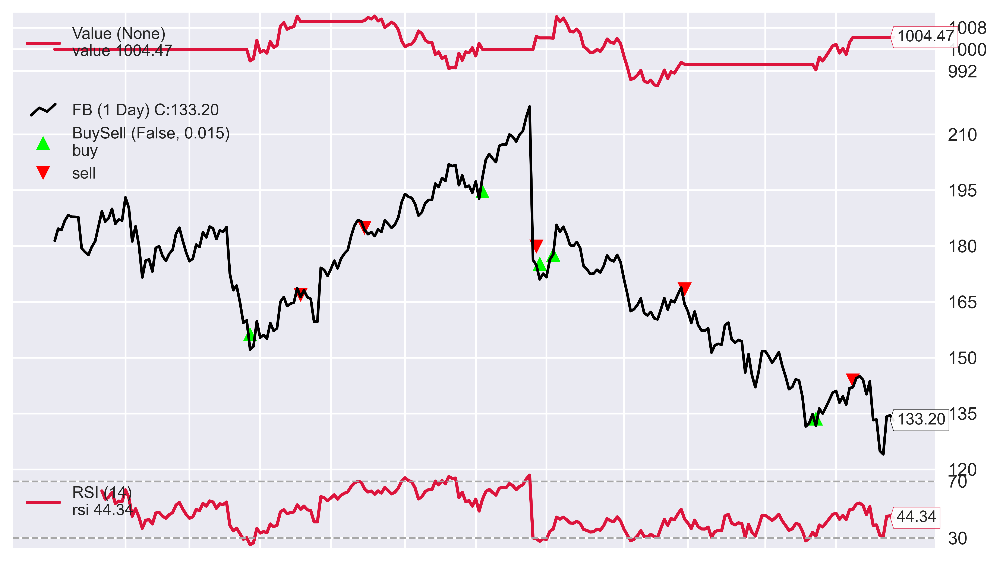

In [92]:
cerebro.plot(iplot=True, volume=False)

## Building an Interactive Dashboard for Technical Analysis

### How to do it...

1. Import the libraries:

In [93]:
import ipywidgets as wd
from ipywidgets import interact, interact_manual
import cufflinks as cf
import pandas as pd 
import yfinance as yf
from plotly.offline import iplot, init_notebook_mode

init_notebook_mode()

2. Define the possible values for assets and technical indicators:

In [94]:
stocks = ['TWTR', 'MSFT', 'GOOGL', 'FB', 'TSLA', 'AAPL']
indicators = ['Bollinger Bands', 'MACD', 'RSI']

3. Define a function for creating the interactive plot:

In [95]:
def ta_dashboard(asset, indicator, start_date, end_date, 
                 bb_k, bb_n, macd_fast, macd_slow, macd_signal,
                 rsi_periods, rsi_upper, rsi_lower):
    
    df = yf.download(asset, 
                     start=start_date, 
                     end=end_date,
                     progress=False,
                     auto_adjust=True)

    qf = cf.QuantFig(df, title=f'TA Dashboard - {asset}', 
                     legend='right', name=f'{asset}')
            
    if 'Bollinger Bands' in indicator: 
        qf.add_bollinger_bands(periods=bb_n, 
                               boll_std=bb_k)
    if 'MACD' in indicator: 
        qf.add_macd(fast_period=macd_fast, 
                    slow_period=macd_slow, 
                    signal_period=macd_signal)
    if 'RSI' in indicator: 
        qf.add_rsi(periods=rsi_periods, 
                   rsi_upper=rsi_upper, 
                   rsi_lower=rsi_lower, 
                   showbands=True)

    return qf.iplot()

4. Define the selectors:

In [96]:
stocks_selector = wd.Dropdown(
    options=stocks, 
    value=stocks[0], 
    description='Asset'
)

indicator_selector = wd.SelectMultiple(
    description='Indicator',
    options=indicators, 
    value=[indicators[0]]
)

start_date_selector = wd.DatePicker(
    description='Start Date', 
    value=pd.to_datetime('2018-01-01'), 
    continuous_update=False
)

end_date_selector = wd.DatePicker(
    description='End Date', 
    value=pd.to_datetime('2018-12-31'), 
    continuous_update=False
)

5. Define a label and group the selectors inside a container:

In [97]:
main_selector_label = wd.Label('Main parameters', 
                               layout=wd.Layout(height='45px'))

main_selector_box = wd.VBox(children=[main_selector_label,
                                      stocks_selector,
                                      indicator_selector,
                                      start_date_selector,
                                      end_date_selector])

6. Define the secondary selectors for Bollinger Bands:

In [98]:
bb_label = wd.Label('Bollinger Bands')

n_param = wd.IntSlider(value=20, min=1, max=40, step=1, 
                       description='N:', continuous_update=False)

k_param = wd.FloatSlider(value=2, min=0.5, max=4, step=0.5, 
                         description='k:', continuous_update=False)

bollinger_box = wd.VBox(children=[bb_label, n_param, k_param])

7. Define the secondary selectors for MACD:

In [99]:
macd_label = wd.Label('MACD')

macd_fast = wd.IntSlider(value=12, min=2, max=50, step=1, 
                         description='Fast avg:', 
                         continuous_update=False)

macd_slow = wd.IntSlider(value=26, min=2, max=50, step=1, 
                         description='Slow avg:', 
                         continuous_update=False)

macd_signal = wd.IntSlider(value=9, min=2, max=50, step=1, 
                           description='MACD signal:', 
                           continuous_update=False)

macd_box = wd.VBox(children=[macd_label, macd_fast, 
                             macd_slow, macd_signal])

8. Define the secondary selectors for RSI:

In [100]:
rsi_label = wd.Label('RSI')

rsi_periods = wd.IntSlider(value=14, min=2, max=50, step=1, 
                           description='RSI periods:', 
                           continuous_update=False)

rsi_upper = wd.IntSlider(value=70, min=1, max=100, step=1, 
                         description='Upper Thr:', 
                         continuous_update=False)

rsi_lower = wd.IntSlider(value=30, min=1, max=100, step=1, 
                         description='Lower Thr:', 
                         continuous_update=False)

rsi_box = wd.VBox(children=[rsi_label, rsi_periods, 
                            rsi_upper, rsi_lower])

9. Create the labels and group the selectors into containers:

In [101]:
sec_selector_label = wd.Label('Secondary parameters', 
                              layout=wd.Layout(height='45px'))
blank_label = wd.Label('', layout=wd.Layout(height='45px'))

sec_box_1 = wd.VBox([sec_selector_label, bollinger_box, macd_box])
sec_box_2 = wd.VBox([blank_label, rsi_box])

secondary_selector_box = wd.HBox([sec_box_1, sec_box_2])

10. Group the boxes and prepare the interactive output:

In [102]:
controls_dict = {'asset':stocks_selector, 
                 'indicator':indicator_selector, 
                 'start_date':start_date_selector, 
                 'end_date':end_date_selector, 
                 'bb_k':k_param, 
                 'bb_n':n_param,
                 'macd_fast': macd_fast, 
                 'macd_slow': macd_slow, 
                 'macd_signal': macd_signal,
                 'rsi_periods': rsi_periods, 
                 'rsi_upper': rsi_upper,
                 'rsi_lower': rsi_lower}

ui = wd.HBox([main_selector_box, secondary_selector_box])
out = wd.interactive_output(ta_dashboard, controls_dict)

11. Display the dashboard:

In [103]:
display(ui, out)

Output(outputs=({'output_type': 'display_data', 'data': {'application/vnd.plotly.v1+json': {'config': {'linkTe…

# Doing a backtest in Pandas

In [145]:
import numpy as np

In [107]:
df_twtr = yf.download('TWTR', 
                       start='2018-01-01', 
                       end='2018-12-31',
                       progress=False,
                       auto_adjust=True)

In [109]:
df_twtr.head().append(df_twtr.tail())

,Open,High,Low,Close,Volume
Date,,,,,
2018-01-02,24.070000,24.570000,23.850000,24.510000,15297200
2018-01-03,24.559999,24.680000,24.070000,24.450001,12832600
2018-01-04,24.500000,24.590000,23.690001,23.990000,17653500
2018-01-05,24.070000,24.570000,23.879999,24.320000,14953200
2018-01-08,24.370001,24.780001,23.879999,24.590000,17831300
2018-12-21,29.309999,29.760000,27.040001,27.309999,38714100
2018-12-24,26.549999,27.270000,26.260000,26.450001,18208300
2018-12-26,27.000000,28.700001,26.799999,28.660000,35529600
2018-12-27,28.139999,28.920000,27.260000,28.680000,31987700


### Let's just use the Close price

In [142]:
df_bt = pd.DataFrame(df_twtr.Close)

In [143]:
df_bt["30_day_SMA"] = df_bt.Close.rolling(30).mean()
df_bt["EWMA_hl=10"] = df_bt.Close.ewm(halflife=10).mean()

<IPython.core.display.Javascript object>


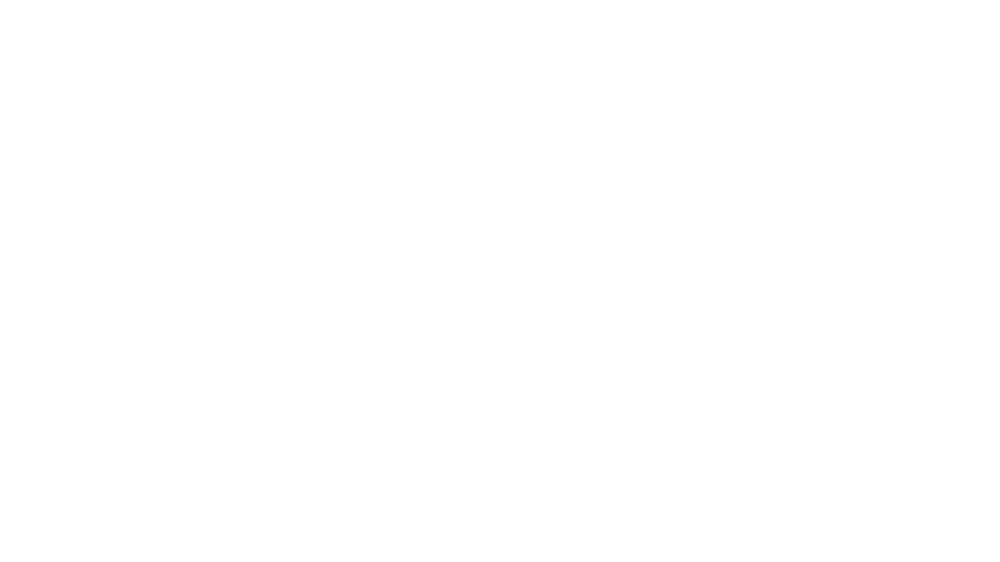

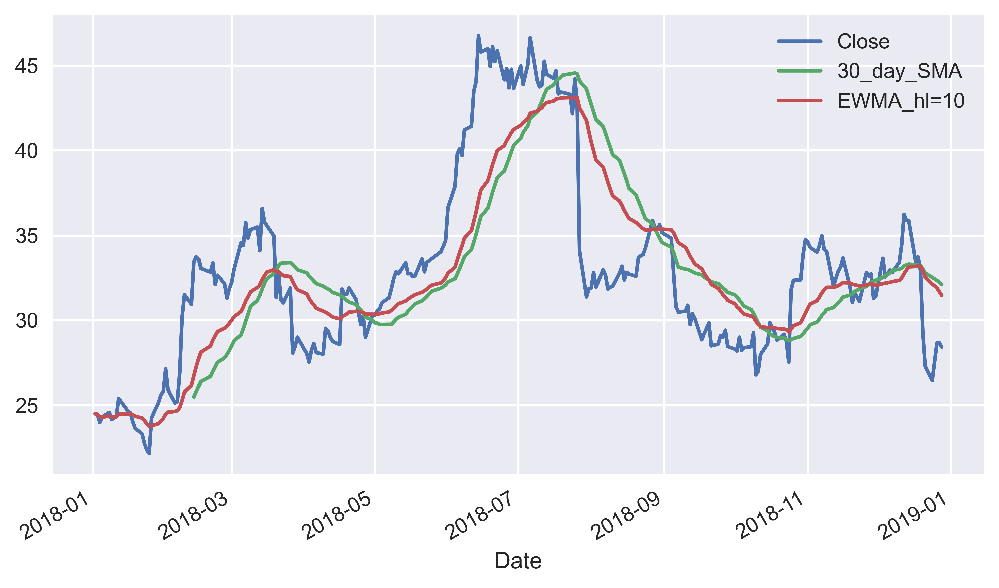

In [144]:
df_bt.plot(legend=True)

### A simple strategy

**if close > SMA:**

    go long (hold one unit of asset)
    
**if close < SMA:**

    go short (hold a short position in one unit of the asset)

In [146]:
df_bt["signal"] = np.sign(df_bt.Close - df_bt["30_day_SMA"])

C:\Users\Josep\anaconda3\envs\Stochastic_finance\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in sign



### What does our portfolio look like?

<IPython.core.display.Javascript object>


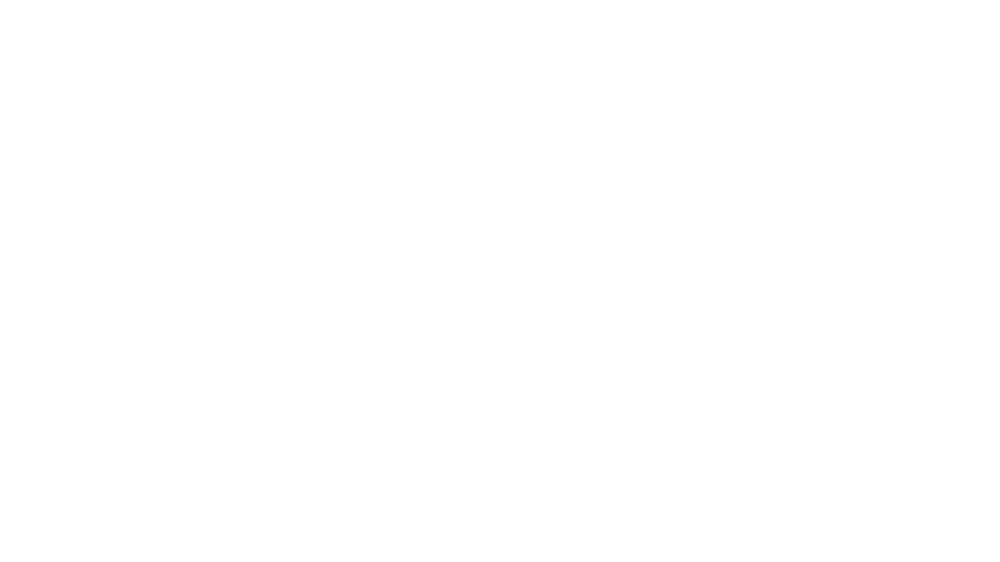

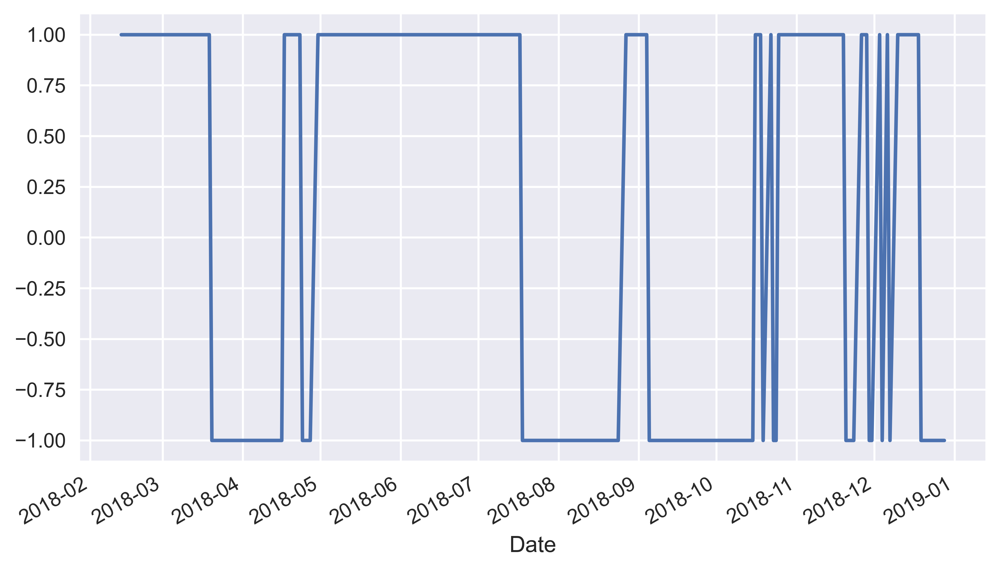

In [148]:
df_bt.signal.plot()

### How does this strategy perform?

In [149]:
df_bt["daily_returns"] = df_bt.Close - df_bt.Close.shift(1)

In [150]:
df_bt.head()

,Close,30_day_SMA,EWMA_hl=10,signal,daily_returns
Date,,,,,
2018-01-02,24.510000,NaN,24.510000,NaN,NaN
2018-01-03,24.450001,NaN,24.478961,NaN,-0.059999
2018-01-04,23.990000,NaN,24.304555,NaN,-0.460001
2018-01-05,24.320000,NaN,24.308827,NaN,0.330000
2018-01-08,24.590000,NaN,24.373114,NaN,0.270000


Now we want to multiply the portfolio (signal) by the returns of the following day

In [152]:
df_bt["signal_returns"] = df_bt.signal*df_bt.daily_returns.shift(-1)

In [157]:
df_bt.dropna(inplace=True)

### How does our AUM develop over time?

<IPython.core.display.Javascript object>


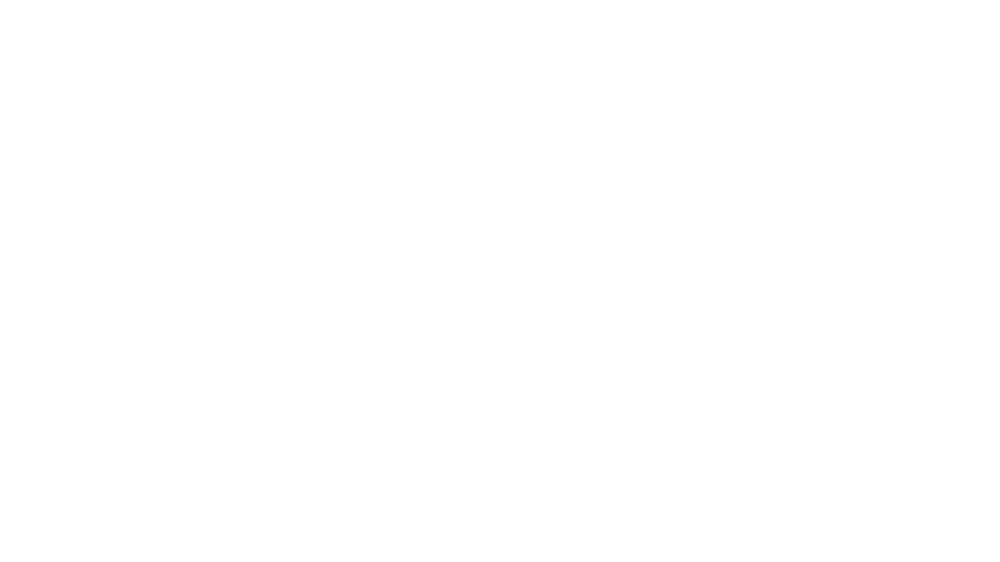

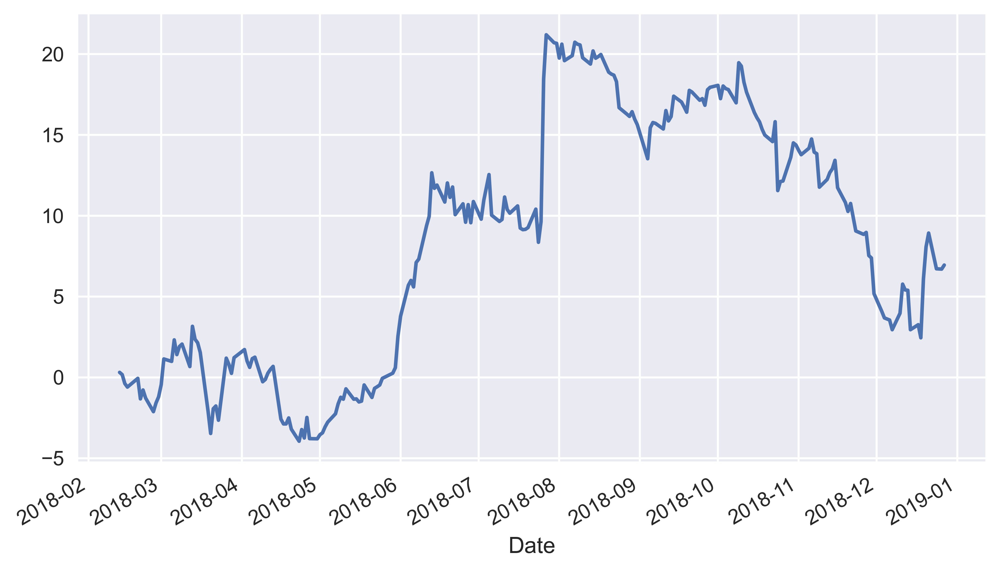

In [158]:
df_bt.signal_returns.cumsum().plot()

In [161]:
print(f"We have made {df_bt.signal_returns.cumsum()[-1]} dollars. Let's live trade it!")

We have made 6.950008392333984 dollars. Let's live trade it!


### How would one add transaction costs?